# A2 Image Stitching & Object Detection 

Student Name: Irene Huang 

Student ID : 260740689 

## 2 Image Stitching 

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [3]:
def warpPerspectivePadded(
        imgl, H, imgr_shape):
    """Performs an affine or Euclidean/rigid warp with padding.
    Parameters
    ----------
    imgl : image to be warped i.e. left image
    imgr : shape of static image i.e. shape of central image
    M : `3x3` Homography matrix.
    Returns
    -------
    src_warped : padded and warped source image
    """
    
    src = imgl
    dst_shape = imgr_shape
    M = H
    
    # it is enough to find where the corners of the image go to find
    # the padding bounds; points in clockwise order from origin
    _, src_w = src.shape[:2]
    lin_pts = np.array([
        [0, src_w],
        [0, 0],
        [1, 1]])
    # transform points
    transf_lin_pts = M.dot(lin_pts) #M[:, :2].dot(lin_pts) + M[:, 2].reshape(3, 1)
    transf_lin_pts /= transf_lin_pts[-1:,:]
    
    # find min and max points
    min_x = np.floor(np.min(transf_lin_pts)).astype(int)
    max_x = np.ceil(np.max(transf_lin_pts)).astype(int)

    # add translation to the transformation matrix to shift to positive values
    anchor_x = 0
    transl_transf = np.eye(3,3)
    if min_x < 0:
        anchor_x = -min_x
        transl_transf[0,2] = anchor_x
        
    shifted_transf = transl_transf.dot(M)
    shifted_transf /= shifted_transf[2,2]

    # create padded destination image
    dst_h, dst_w,_ = dst_shape
    dst_pad_w = anchor_x + max(max_x, dst_w)
    src_warped = cv2.warpPerspective(src, shifted_transf, (dst_pad_w, dst_h), borderMode=cv2.BORDER_CONSTANT, borderValue=0)
    return src_warped

#### 1 Compute SIFT keypoints and corresponding descriptors for left and central images.

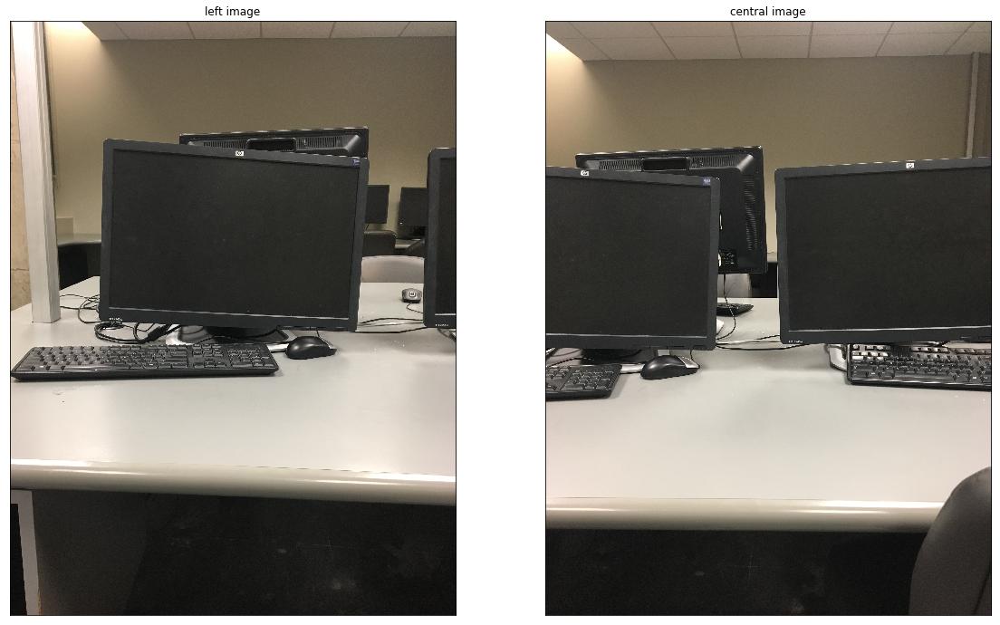

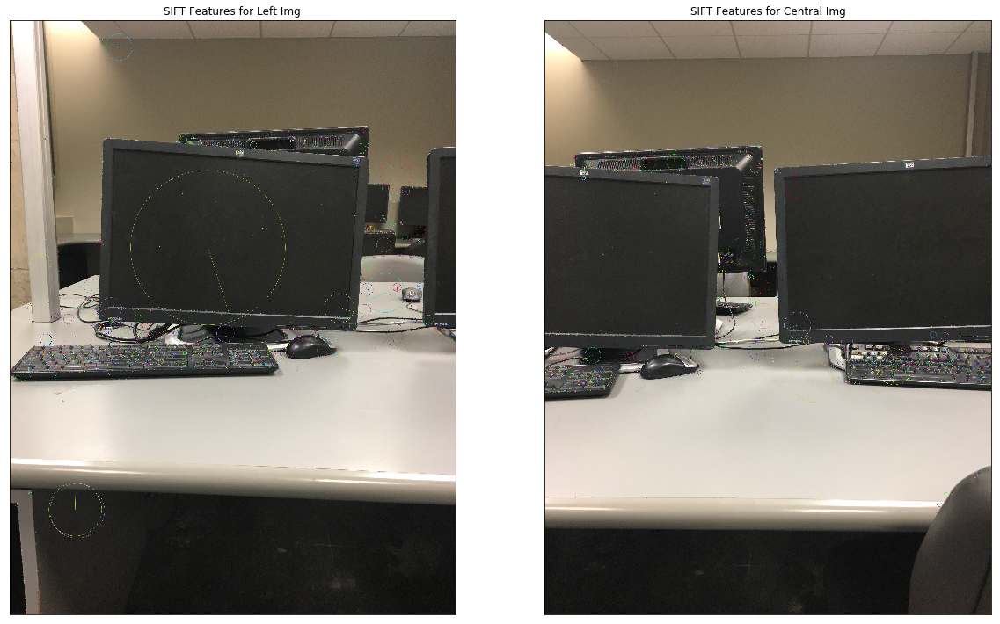

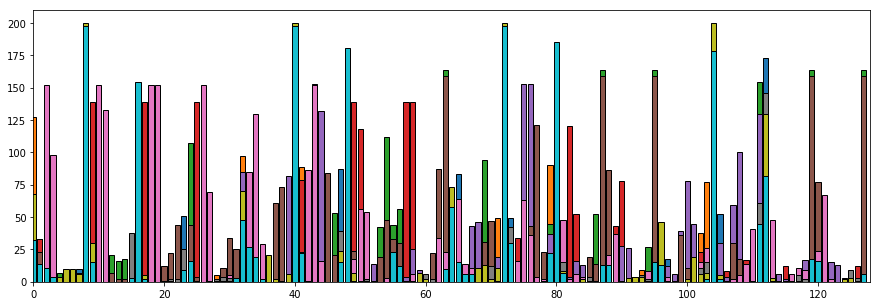

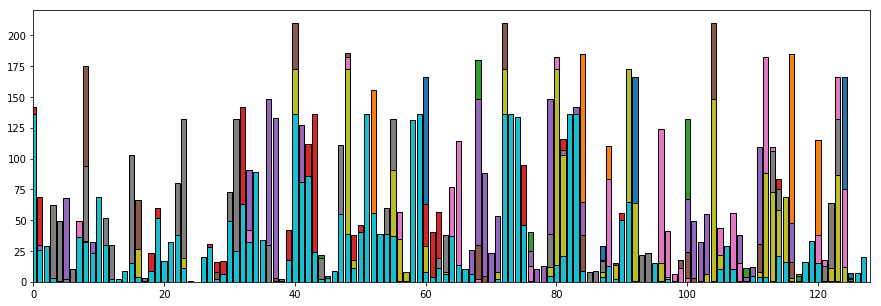

In [42]:
# read images 
img1 = cv2.imread("stitch1.JPG")
img2 = cv2.imread("stitch2.JPG")

imgleft_kp = img1.copy()
imgcenter_kp = img2.copy()

# conversion 
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)
# img3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)

# display original images 
plt.figure(figsize=(30, 30))
plt.subplot(131), plt.imshow(img1)
plt.title("left image"), plt.xticks([]), plt.yticks([])
plt.subplot(132), plt.imshow(img2)
plt.title("central image"), plt.xticks([]), plt.yticks([])
# plt.subplot(133), plt.imshow(img3)
# plt.title("right image"), plt.xticks([]), plt.yticks([])

# Compute SIFT Keypoints 

# conversion
imgleft_kp = cv2.cvtColor(imgleft_kp, cv2.COLOR_BGR2RGB)
imgcenter_kp = cv2.cvtColor(imgcenter_kp, cv2.COLOR_BGR2RGB)
# imgright_kp = cv2.cvtColor(imgright_kp, cv2.COLOR_BGR2RGB)


# create SIFT objects
sift_obj = cv2.xfeatures2d.SIFT_create() 

# detect SIFT features, compute keypoint. Can pass a mask if want to search only a part of image
# Computer SIFT Descriptor
keypoint_left, descriptors_left = sift_obj.detectAndCompute(img1, None)  
keypoint_central, descriptors_central = sift_obj.detectAndCompute(img2, None)

# draw keypoints on left and central images 
    # draw small circles on the locations of the kepoints 
    # if pass cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, it will draw
    # a circle with size of keypoint and it will show its origintation 
    # ref: https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_sift_intro/py_sift_intro.html
cv2.drawKeypoints(img1, keypoint_left, imgleft_kp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(img2, keypoint_central, imgcenter_kp, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(imgleft_kp)
plt.title("SIFT Features for Left Img"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(imgcenter_kp)
plt.title("SIFT Features for Central Img"), plt.xticks([]), plt.yticks([])


# plot 10 SIFT descriptors
num = 10
plt.figure(figsize=(15,5))
for i in range(num):
    plt.bar(np.arange(0,128),descriptors_left[i], edgecolor='k')
    plt.xlim([0,128])
    

plt.figure(figsize=(15,5))
for j in range(num):
    plt.bar(np.arange(0,128),descriptors_central[j], edgecolor='k')
    plt.xlim([0,128])

plt.show()

#### 2 Find matching keypoints in two images and display the 20 best pairs.

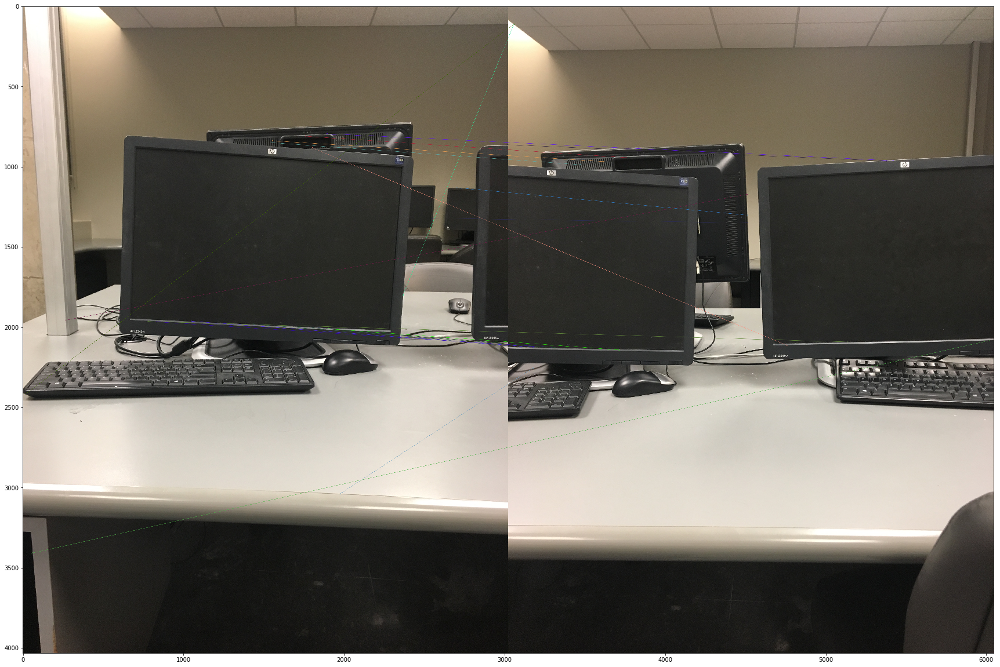

In [111]:
# Create BFMatcher object 

    # cv2.BFMatcher(): For each descriptor in the first set, this matcher finds 
    # the closest descriptor in the second set by trying each one. 
    # This descriptor matcher supports masking permissible matches 
    # of descriptor sets.
    # reference: https://docs.opencv.org/3.4/d3/da1/classcv_1_1BFMatcher.html#details

bf = cv2.BFMatcher() 

# Match descriptors in two images 
matches = bf.match(descriptors_left, descriptors_central)

# Sort matches in distance 
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints on images 

imgMatch = cv2.drawMatches(img1, keypoint_left, img2,  keypoint_central, matches[:20], img1, flags=2)
# imgMatch = cv2.drawMatches(img2, keypoint_central, img1,  keypoint_left, matches[:20], img2, flags=2)

plt.figure(figsize=(30,30))
plt.imshow(imgMatch)
plt.show()




#### 3 Find homography using RANSAC method. Implement RANSAC from scratch. Do not use OpenCV implementation. (6 points)
 – Steps to compute homography using RANSAC are given in Lecture 9 - slide 52.
 
 – Note on step 3: Compute H using opencv function findHomography with method=0.
 
 – Note on step 5: Before computing distance, convert projected key- points from homogeneous to euclidean space using opencv function convertPointsFromHomogeneous.

distance is  15.187395775896674
distance is  10.264891695213
distance is  10.221926025979744
max inlier is  3
distance is  17.89020214769669
distance is  11.333553027807094
distance is  10.227827006863263
distance is  15.562235320399333
distance is  14.268793398756484
distance is  12.182497001287
distance is  12.107452138096145
distance is  15.39034666103847
distance is  18.21543103179747
distance is  12.107452138096145
distance is  7.382416379316935
distance is  9.81494679654019
distance is  10.435336729899944
distance is  10.435336729899944
distance is  9.81494679654019
distance is  13.167218640312932
distance is  13.022819372666842
distance is  13.022819372666842
max inlier is  12
distance is  19.936670413574674
distance is  19.49354547248209
distance is  13.61834206345018
distance is  13.61834206345018
distance is  19.090545307363854
distance is  15.217029478088339
distance is  17.769392970182633
distance is  6.914859755329218
distance is  6.914859755329218
distance is  13.16963686

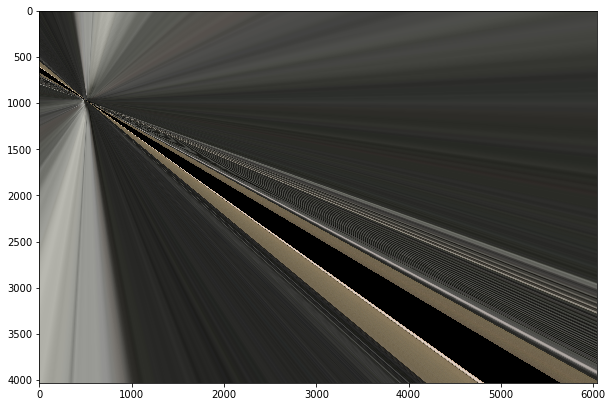

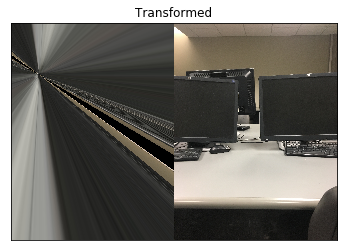

In [223]:
def ransac(source, dest): 

    # set the number of samples N
    numOfSamples = 200
    sampleCount = 0
    distanceThresh = 20
    distance_array = []
    numOfInlier = 0
    maxInlier = 0
    finalH = []
    best_dest_inlier = []
    best_source_inlier = []

    while sampleCount < numOfSamples:  # repeat for N times 

        # choose 4 random potential matches 
        random1 = np.random.randint(0, len(dest))
        random2 = np.random.randint(0, len(dest))
        random3 = np.random.randint(0, len(dest))
        random4 = np.random.randint(0, len(dest))
        random_dest = np.array([dest[random1], dest[random2],dest[random3],dest[random4]]) # choose value in array
        random_source = np.array([source[random1], source[random2],source[random3],source[random4]]) 

        # compute H using four potential matches 
        # cv2.findHomography(sourcePt, destPt, method)
        H, __ = cv2.findHomography(random_source, random_dest, 0)
        
        # find best fit line using least square method 
        array_dest = []  
        array_source = []
        
        for i in range(len(dest)): 
            if i != random1 and i != random2 and i != random3 and i != random4: 
                
                array_dest.append(dest[i])
        
        for i in range(len(source)): 
            
            if i != random1 and i != random2 and i != random3 and i != random4: 
                array_source.append(source[i])
                
        array_dest = np.array(array_dest)
        array_source = np.array(array_source)
           
        source_inlier = [] 
        destination_inlier = []
        
        # calculate calculate distance and count inliers 
        for i in range (0, len(array_dest)):  # at most four times 

            # project points from x to x' for each potentially matching pair Xi' = HXi
            mpc_reshape = np.array([array_source[i].item(0), array_source[i].item(1), 1])
            projectpoints = np.dot(mpc_reshape, H.T)
            projectpoints = np.array([[projectpoints[0], projectpoints[1], 1]])
         
            # convert keypoints to eucliean space 
            estimate_array = cv2.convertPointsFromHomogeneous(projectpoints)
            estimate_array = [[estimate_array[0].item(0), estimate_array[0].item(1)]]
          
            # count points with projected distance < t using a for loop 
            est_x = estimate_array[0][0]
            est_y = estimate_array[0][1]
            array_dest_x = array_dest[i].item(0)
            array_dest_y = array_dest[i].item(1)
            
            # calculate distance 
            distance = np.sqrt(np.square(est_x - array_dest_x) + np.square(est_y - array_dest_y))
      
            
            # count inliers with distance threshold 
            if distance < distanceThresh and distance != 0:
                print("distance is ", distance)
                numOfInlier = numOfInlier + 1 
                source_inlier.append(array_source[i])
                destination_inlier.append(array_dest[i])
                
                # calculate H using the largest set of inliers 
                
        source_inlier = np.array(source_inlier)
        destination_inlier = np.array(destination_inlier)
        
        # update the best inliers
        if numOfInlier > maxInlier: 
            best_source_inlier = source_inlier
            best_dest_inlier = destination_inlier 
            best_source_inlier = np.array(best_source_inlier)
            best_dest_inlier = np.array(best_dest_inlier)
#             finalH, __ = cv2.findHomography(source_inlier, destination_inlier, 0)
  
#             transformed = cv2.warpPerspective(img1, finalH, (img2.shape[1]+img1.shape[1],img2.shape[0])) # imgr: image to transform, and keep the left one 
#             transformed = warpPerspectivePadded(img1, finalH, img2.shape)
    
#             plt.figure(figsize=(10,10))
#             plt.imshow(transformed)
#             plt.show() 
    
            maxInlier = numOfInlier 
            print("max inlier is ", maxInlier)
            
#             print(maxInlier)

        # reset values 
        numOfInlier = 0 
        array_source = [] 
        array_dest = [] 
        source_inlier = []
        destination_inlier = [] 

        # update the number of samples 
        sampleCount = sampleCount + 1
        
    return best_source_inlier, best_dest_inlier 

GoodMatches = [] 
for j, k in enumerate(matches): 
    if k.distance < 1000: 
        GoodMatches.append((k.trainIdx, k.queryIdx))

# Arrange matching keypoints in two lists 
dest = np.float32([keypoint_central[j].pt for(j, __) in GoodMatches])
source = np.float32([keypoint_left[j].pt for(__, j) in GoodMatches])

best_source_inlier, best_dest_inlier  = ransac(source, dest)

finalH, __ = cv2.findHomography(best_source_inlier, best_dest_inlier, 0)
print(finalH)

transformed = cv2.warpPerspective(img1, finalH, (img2.shape[1]+img1.shape[1],img2.shape[0])) # imgr: image to transform, and keep the left one 
            
plt.figure(figsize=(10,10))
plt.imshow(transformed)
plt.show() 

glued = transformed.copy() 
glued[:,img2.shape[1]:,:]=img2
plt.imshow(glued), plt.title("Transformed")
plt.xticks([]), plt.yticks([])
plt.show() 



In [171]:
def ransac(mpc, mpl): 

    # set the number of samples N
    numOfSamples = 200
    sampleCount = 0
    distanceThresh = 3
    distance_array = []
    numOfInlier = 0
    maxInlier = 0
    finalH = []

    while sampleCount < numOfSamples:  # repeat for N times 

        # choose 4 random potential matches 
        random1 = np.random.randint(0, len(mpc))
        random2 = np.random.randint(0, len(mpc))
        random3 = np.random.randint(0, len(mpc))
        random4 = np.random.randint(0, len(mpc))
        random_center = np.array([mpc[random1], mpc[random2],mpc[random3],mpc[random4]]) # choose value in array
        random_left = np.array([mpl[random1], mpl[random2],mpl[random3],mpl[random4]]) 

        # compute H using four potential matches 
        # cv2.findHomography(sourcePt, destPt, method)
        H, __ = cv2.findHomography(random_left, random_center, 0)
        
        # find best fit line using least square method 
        # y = ax + b -> y = slope * x + y_intersect 
#         sum_x = 0
#         sum_y = 0
#         for i in range(len(random_left)): 
#             sum_x += random_left[i][0]
#             sum_y += random_left[i][1]
#         mean_x = sum_x/len(random_left)
#         mean_y = sum_y/len(random_left)
        
#         # calculate slope and y_intersection 
#         numerator = 0
#         denom = 0
#         for i in range(len(random_left)):
#             numerator += (random_left[i][0] - mean_x)*(random_left[i][1] - mean_y)
#             denom += (random_left[i][0] - mean_x) ** 2
#         slope = numerator / denom 
#         y_intersect = mean_y - slope * mean_x
        
        # Use the remaining array elements to count the number of inliers 
#         print("size of mpc is ", len(mpc))
#         print("size of mpl is ", len(mpl))
        array_center = []  
        array_left = []
        
        for i in range(len(mpc)): 
            if i != random1 and i != random2 and i != random3 and i != random4: 
                
                array_center.append(mpc[i])
        
        for i in range(len(mpl)): 
            
            if i != random1 and i != random2 and i != random3 and i != random4: 
                array_left.append(mpl[i])
                
        array_center = np.array(array_center)
        array_left = np.array(array_left)
           
    
#         print("size of array_center is ", len(array_center)) 
#         print("size of array_left is ", len(array_left))
        
        source_inlier = [] 
        destination_inlier = []
        
        # calculate calculate distance and count inliers 
        for i in range (0, len(array_center)):  # at most four times 

            # project points from x to x' for each potentially matching pair Xi' = HXi
            mpc_reshape = np.array([array_left[i].item(0), array_left[i].item(1), 1])
#             print("mpc_reshape is ", mpc_reshape)
#             denominator = H[2].dot(mpc_reshape.transpose())
#             print("denominator is ", denominator)
#             projectpoints = np.array([[H[0].dot(mpc_reshape.transpose())/denominator, H[1].dot(mpc_reshape.transpose())/denominator, 1]])
#             print("projected point is ", projectpoints)
#             projectpoints = H.dot(mpc_reshape)
#             projectpoints = np.array([[projectpoints[0], projectpoints[1], 1]])
            
    
            
            # convert keypoints to eucliean space 
            estimate_array = cv2.convertPointsFromHomogeneous(projectpoints)
#             estimate_array = projectpoints
            estimate_array = [[estimate_array[0].item(0), estimate_array[0].item(1)]]
#             print("estimate array is ",  estimate_array)
          
            # count points with projected distance < t using a for loop 
            est_x = estimate_array[0][0]
            est_y = estimate_array[0][1]
            array_center_x = array_center[i].item(0)
            array_center_y = array_center[i].item(1)

            # calculate closest point from the point to the model line 
#             model_x = (est_x - slope * y_intersect + slope * est_y)/(slope**2 + 1)
#             model_y = model_x * slope + y_intersect
            
            # calculate distance 
            distance = np.sqrt(np.square(est_x - array_center_x) + np.square(est_y - array_center_y))
#             distance = np.sqrt(np.square(est_x - model_x) + np.square(est_y - model_y))
#             print("distance is ", distance)
            
            
            # count inliers with distance threshold 
            if distance < distanceThresh and distance != 0:
                print("distance is ", distance)
                numOfInlier = numOfInlier + 1 
#                 source_inlier.append([est_x, est_y])
                source_inlier.append(array_left[i])
                destination_inlier.append(array_center[i])
                
                # calculate H using the largest set of inliers 
                
        source_inlier = np.array(source_inlier)
        destination_inlier = np.array(destination_inlier)
        
        # update the best inliers
        if numOfInlier > maxInlier: 
#             finalH, __ = cv2.findHomography(random_left, random_center, 0)
            
            finalH, __ = cv2.findHomography(source_inlier, destination_inlier, 0)
         
            transformed = cv2.warpPerspective(img1, finalH, (img2.shape[1]+img1.shape[1],img2.shape[0])) # imgr: image to transform, and keep the left one 
            
            plt.figure(figsize=(10,10))
            plt.imshow(transformed)
            plt.show() 
            print(finalH)
            maxInlier = numOfInlier 
            print("max inlier is ", maxInlier)
            
#             print(maxInlier)

        # reset values 
        numOfInlier = 0 
        array_left = [] 
        array_center = [] 
        source_inlier = []
        destination_inlier = [] 

        # update the number of samples 
        sampleCount = sampleCount + 1
        
    return finalH 

# print("mpc")

GoodMatches = [] 
for j, k in enumerate(matches): 
    if k.distance < 1000: 
        GoodMatches.append((k.trainIdx, k.queryIdx))

# Arrange matching keypoints in two lists 
mpc = np.float32([keypoint_central[j].pt for(j, __) in GoodMatches])
mpl = np.float32([keypoint_left[j].pt for(__, j) in GoodMatches])
# mpc = np.float32([keypoint_central[j].pt for(__, j) in GoodMatches])
# mpl = np.float32([keypoint_left[j].pt for(j, __) in GoodMatches])

finalH = ransac(mpc, mpl)
print(finalH)

transformed = cv2.warpPerspective(img1, finalH, (img2.shape[1]+img1.shape[1],img2.shape[0])) # imgr: image to transform, and keep the left one 
            
plt.figure(figsize=(10,10))
plt.imshow(transformed)
plt.show() 

#Test 
# H = []
# H.append([ 3.15643745e+00,  1.14696556e+00, -6.49005141e+02])
# H.append([ 1.19398873e+00,  3.10951696e+00, -3.16249974e+03])
# H.append([ 5.03960470e-04,  3.25873337e-04,  1.00000000e+00])
# finalH = np.asarray(H)

# (img2.shape[1]+img1.shape[1], img2.shape[0], _)
# transformed = warpPerspectivePadded(img1, finalH, img2.shape)
# finalH, __ = cv2.findHomography(mpc, mpl, cv2.RANSAC, 5)

#good 
# transformed = cv2.warpPerspective(img1, finalH, (img2.shape[1]+img1.shape[1],img2.shape[0])) # imgr: image to transform, and keep the left one 


# transformed = cv2.warpPerspective(img1, finalH, (img2.shape[1]+img1.shape[1],img2.shape[0]))

# print(transformed)                                    
                                    
# plt.figure(figsize=(10,10))
# plt.imshow(transformed), plt.title("Transformed")
# plt.xticks([]), plt.yticks([])
# plt.show() 

glued = transformed.copy() 
glued[:,img2.shape[1]:,:]=img2
plt.imshow(glued), plt.title("Transformed")
plt.xticks([]), plt.yticks([])
plt.show() 

plt.imshow(img1), plt.title("Transformed")
plt.xticks([]), plt.yticks([])
plt.show()

plt.imshow(img2), plt.title("Transformed")
plt.xticks([]), plt.yticks([])
plt.show() 

"""
[[ 3.15643745e+00  1.14696556e+00 -6.49005141e+02]
 [ 1.19398873e+00  3.10951696e+00 -3.16249974e+03]
 [ 5.03960470e-04  3.25873337e-04  1.00000000e+00]]
 
"""


NameError: name 'projectpoints' is not defined

#### 4 Apply transformation to left image. Central image should not be trans- formed. You are given a function warpPerspectivePadded. Use this function instead of OpenCV function warpPerspective for image trans- formation.

In [46]:
# import function from another jupyter notebook 
# import import_ipynb
# import warpPerspectivePadded

# from warpPerspectivePadded import warpPerspectivePadded

# from ipynb.fs.full.warpPerspectivePadded import warpPerspectivePadded

# warpPerspectivePadded(imgl, H, imgr_shape)
# image 1

# 
# transformed = cv2.warpPerspective(img1, finalH, (img2.shape[1]+img1.shape[1], img2.shape[0])) 


#### 5 Stitch transformed left image and original central image together using pyramid image blending

In [220]:
# define pyramid_blending function 
# img1: left image 
# img2: right image 
# level: Laplacian level 

def pyramid_blending(img1, img2, level): 
    # generate Gaussian pyramid for img1 and img2
    GA = img1.copy()
    gpA = [GA]
    for i in range(level):
        GA = cv2.pyrDown(GA) # blur image and downsample 
        gpA.append(GA)
    
    GB = img2.copy()
    gpB = [GB]
    for i in range(level):
        GB = cv2.pyrDown(GB)
        gpB.append(GB)
        
    # generate Laplacian Pyramid for img1 and img2 
    lpA = [gpA[level-1]]
    lpB = [gpB[level-1]]
    
    for j in range(level-1, 0, -1):  # decrement by 1 each time 
        heightA, widthA, _ = gpA[j-1].shape
        heightB, widthB, _ = gpB[j-1].shape
        GE = cv2.pyrUp(gpA[j],dstsize=(widthA, heightA))
        L = cv2.subtract(gpA[j-1],GE)
        lpA.append(L)
        GE = cv2.pyrUp(gpB[j], dstsize=(widthB, heightB))
        K = cv2.subtract(gpB[j-1],GE)
        lpB.append(K)
    
    # add img1 and img2 with equal weight 
    LS = [] 
    for la,lb in zip(lpA, lpB):
#         r, c, d = la.shape
#         ls = np.hstack((la[:,0:c//2], lb[:,c//2:]))
        ls = np.hstack((la, lb))
        LS.append(ls)
    
    ls = LS[0]
    for k in range(1,level):
        height,width,_ = LS[k].shape

#         ls = cv2.pyrUp(ls, dstsize=(width,height))
        ls = cv2.pyrUp(ls,dstsize=(width,height))
        ls.astype(np.uint8) 
        ls = cv2.add(ls, LS[k])
    
    return ls


(<matplotlib.image.AxesImage at 0x129a3a278>,
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

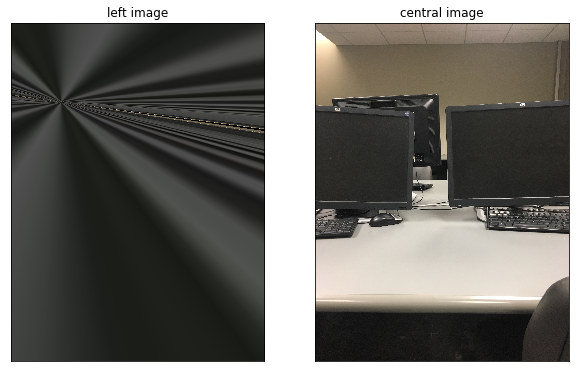

In [221]:
# stitch transformed images

blend_left = transformed[:,:img1.shape[1]]
blend_central = img2 # glued[:,img2.shape[1]:,:]


# stitch transformed left and central image using pyramid image blending 
blend_image = pyramid_blending(blend_left, blend_central, 5) 

# display seperate images 
plt.figure(figsize=(10,10))
plt.subplot(121), plt.title("left image")
plt.imshow(blend_left), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.title("central image") 
plt.imshow(blend_central), plt.xticks([]), plt.yticks([])

#### 6 Display stitched image.

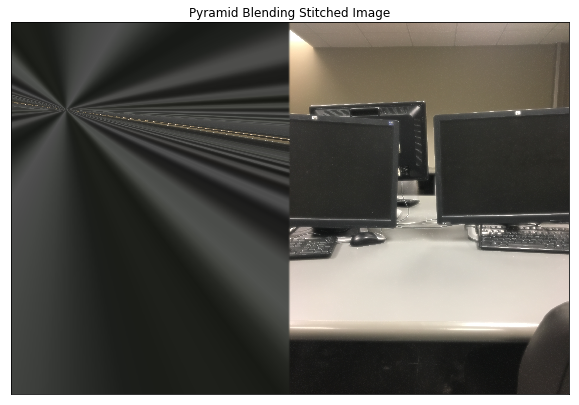

In [222]:
# display stitched image using pyramid blending
plt.figure(figsize=(10,10))
plt.imshow(blend_image), plt.title("Pyramid Blending Stitched Image")
plt.xticks([]), plt.yticks([])
plt.show()


#### Now let’s stitch above resultant image with a right image.
#### 7 Compute SURF keypoints and corresponding descriptors for above stitched image and right image.

4332
19509


(Text(0.5, 1.0, 'SURF Features for Central Img'),
 ([], <a list of 0 Text xticklabel objects>),
 ([], <a list of 0 Text yticklabel objects>))

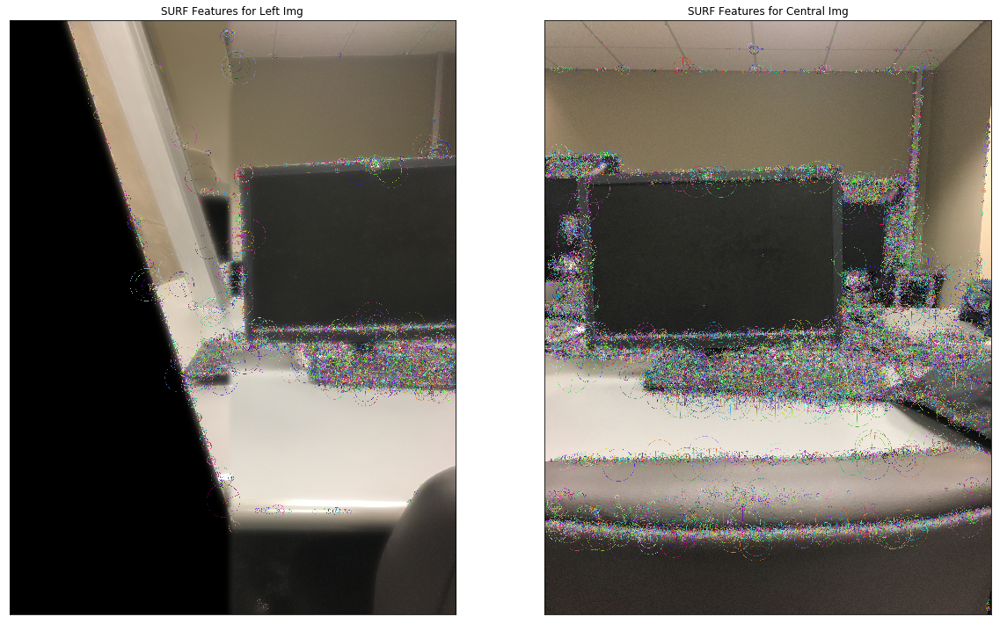

In [30]:
left_img = blend_image.copy() 
right_img = cv2.imread("stitch3.JPG")

right_img = cv2.cvtColor(right_img, cv2.COLOR_BGR2RGB)

# Convert to gray scale 
left_img_gray = cv2.cvtColor(left_img, cv2.COLOR_BGR2GRAY) 
right_img_gray = cv2.cvtColor(right_img, cv2.COLOR_BGR2GRAY)

# TODO downsample the image using resize 

left_img_result = left_img.copy()
right_img_result = right_img.copy() 

# create SURF object 
surf = cv2.xfeatures2d.SURF_create() 

# image should be im gray scale (reference: 
# https://docs.opencv.org/2.4/modules/nonfree/doc/feature_detection.html)
# in SURF.detectAndCompute(img, None)

# compute SURF keypoints and descriptors 
keypoint_left, descriptor_left = surf.detectAndCompute(left_img_gray, None)
surf = cv2.xfeatures2d.SURF_create() 
keypoint_right, descriptor_right = surf.detectAndCompute(right_img_gray, None)

print(len(keypoint_left))
print(len(keypoint_right))

# draw keypoints 
cv2.drawKeypoints(left_img, keypoint_left, left_img_result,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
cv2.drawKeypoints(right_img, keypoint_right, right_img_result,flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# display images with keypoints 
plt.figure(figsize=(20, 20))
plt.subplot(121), plt.imshow(left_img_result)
plt.title("SURF Features for Left Img"), plt.xticks([]), plt.yticks([])
plt.subplot(122), plt.imshow(right_img_result)
plt.title("SURF Features for Central Img"), plt.xticks([]), plt.yticks([])

#### 8 Find matching keypoints in two images and display the 20 best pairs.

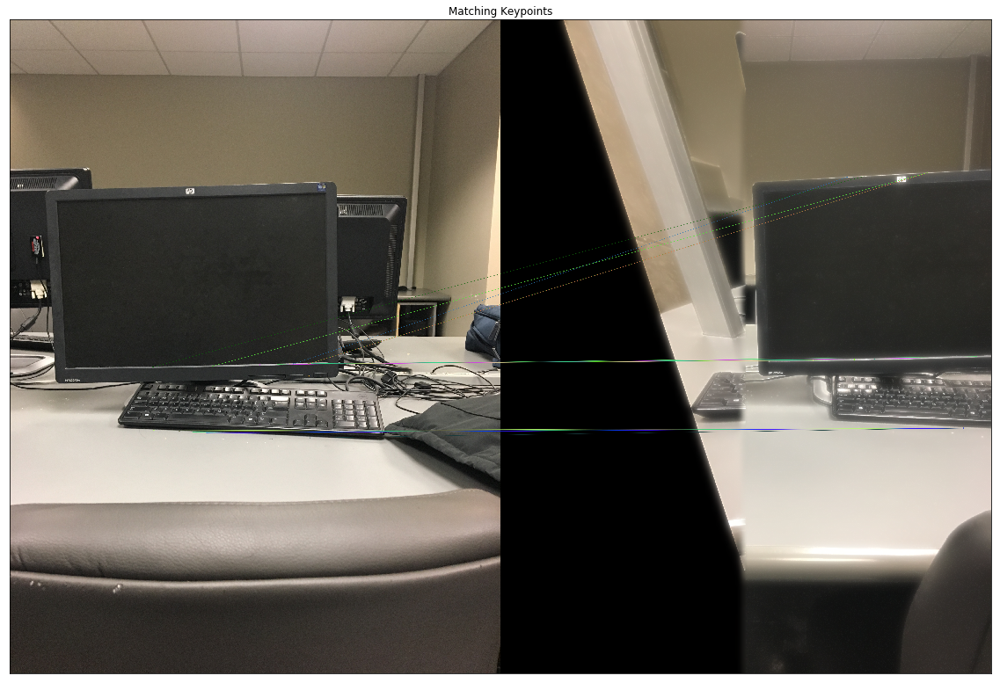

In [31]:
# Create BFMatcher object 
bf = cv2.BFMatcher() 

# Match descriptors in two images 
matches = bf.match(descriptor_right, descriptor_left)

# matches = bf.knnMatch(descriptor_right, descriptor_left, k=10)
   
# Sort matches in distance 
matches = sorted(matches, key = lambda x:x.distance)

# Draw keypoints on images 
# imgMatch = cv2.drawMatchesKnn(left_img, keypoint_left, right_img, keypoint_right, matches[:20], right_img, flags=2)
imgMatch = cv2.drawMatches(right_img, keypoint_right, left_img, keypoint_left, matches[:20], right_img, flags=2)
plt.figure(figsize=(20,20)), plt.xticks([]), plt.yticks([])
plt.imshow(imgMatch), plt.title("Matching Keypoints")
plt.show()

#### 9 Find homography using RANSAC method. Use above implemented RANSAC function. Do not use OpenCV implementation.

distance is  16.91021266497287
distance is  15.103662934204944
max inlier is  2
distance is  6.99360256556406
distance is  18.309242071368693
distance is  4.8493447639730185
distance is  17.29666939963666
distance is  14.713520819667627
distance is  13.794312147880834
distance is  9.692155371685267
distance is  19.940255719470073
distance is  10.527632513475083
distance is  18.909032088065334
distance is  16.81503952254695
distance is  11.309646071773676
max inlier is  3
distance is  12.886604807878024
distance is  18.717216390665403
distance is  15.373963578098497
distance is  14.921480473050316
distance is  8.70155120473768
distance is  10.80520659881237
distance is  8.548843296677537
distance is  19.19627319271784
distance is  14.014863382991917
distance is  11.29702733787961
distance is  6.280998710538658
distance is  6.252298859239311
distance is  14.732019628257175
distance is  8.040930410961144
distance is  9.41665534315731
distance is  11.760084973281808
distance is  16.5172641

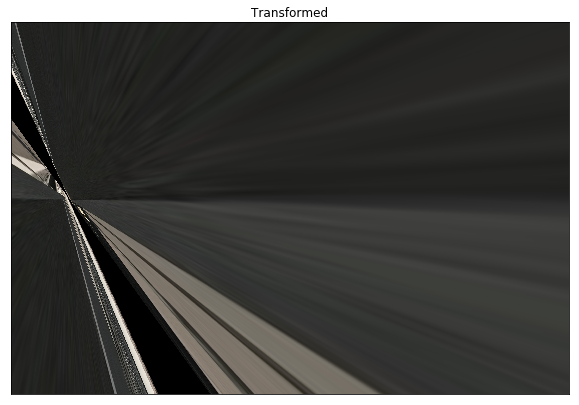

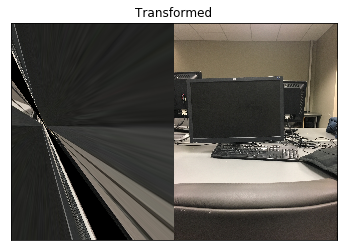

In [225]:
GoodMatches = [] 
for j, k in enumerate(matches): 
    if k.distance < 1000: 
        GoodMatches.append((k.trainIdx, k.queryIdx))       
    
# TODO : check this! 
dest = np.float32([keypoint_left[j].pt for(j, __) in GoodMatches])
source = np.float32([keypoint_right[j].pt for(__, j) in GoodMatches])  
best_source_inlier, best_dest_inlier  = ransac(source, dest)

finalH, __ = cv2.findHomography(best_source_inlier, best_dest_inlier, 0)
print(finalH)


transformed = cv2.warpPerspective(right_img, finalH, (right_img.shape[1]+left_img.shape[1],left_img.shape[0])) # imgr: image to transform, and keep the left one 
# transformed = cv2.warpPerspective(img1, finalH, (img2.shape[1]+img1.shape[1],img2.shape[0]))                                  
                                    
plt.figure(figsize=(10,10))
plt.imshow(transformed), plt.title("Transformed")
plt.xticks([]), plt.yticks([])
plt.show() 

glued = transformed.copy() 
glued[:,right_img.shape[1]:,:]=right_img
plt.imshow(glued), plt.title("Transformed")
plt.xticks([]), plt.yticks([])
plt.show() 


#### 10 Apply transformation to right image. The stitched image should not be transformed. Use OpenCV function warpPerspective for image transfor- mation.

In [91]:
import import_ipynb
import warpPerspectivePadded

In [92]:
# import function from another jupyter notebook 


# warpPerspectivePadded(imgl, H, imgr_shape)
# right_img
transformed = warpPerspectivePadded(right_img, finalH, (left_img.shape[1]+right_img.shape[1], left_img.shape[0])
                                    
plt.figure(figsize=(30,30))
plt.imshow(transformed), plt.title("Transformed")
plt.xticks([]), plt.yticks([])
plt.show()  

SyntaxError: invalid syntax (<ipython-input-92-8e9e7d801a02>, line 8)

#### 11 Stitch transformed right image and already stitched left and central images together using linear image blending.

In [ ]:
# img_width: image width
# ramp_index: center ramp index
# start: starting ramp value 
# end: ending ramp value 
def linear_blending(img_width, ramp_width, ramp_index, start, end):
    array = np.zeros((img_width))
    step = (end-start)/(ramp_width-1)
    index = round(ramp_width - (ramp_width/2))
    for i in range(ramp_width): 
        array[index] = start + step * i 
        index = index + 1 
    
    a[index:] = 1
    return array 

In [ ]:
new_width = right_img.shape[1] + left_img.shape[1]  
image1 = np.zero((left_img.shape[0], new_width, 3))  # need .astype(np.uint8)?? 
image2 = transformed

col, row = image1.shape
real = np.vstack((image1[:round(row/2),:], image2[round(col/2):,:]))

# apply linear blending 
ramp_width = 50
alpha = linear_blending(new_width, ramp_width, round(new_width/2) 0, 1)

# calculate final image
finalImage = (1-alpha.reshape(-1,1,1)) * image1 + alpha.reshape(-1,1,1)*image2
finalImage = np.uint8(finalImage)

#### 12 Display final panoramic image. You can crop panoramic image to remove excess zero-padding; however it is not compulsory. 

In [ ]:
# display image
plt.figure(figsize=(30,30))
plt.imshow(finalImage), plt.title("Final Image")
plt.xticks([]), plt.yticks([]), plt.show() 

#### 13 Compare and comment on effectiveness of pyramid and linear blending. Discuss the pros and cons of both methods. 

In [ ]:
# TODO 




# 3 Object Detection 

#### Training 
#### 1 Resize the training images to 128 × 128

In [21]:
import os 

# read images 
train = [] 
image_list = os.listdir('./train_set/')
size = (128, 128)

# resize images
for file in image_list: 
    image = cv2.imread('./train_set/' + file)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, size)
    
    # put in the list 
    train.append(image)
    
print(len(train))

30


#### 2 Compute HoG features using cell size of 4 × 4 pixels, block size of 2 × 2 cells and 9 orientation bins
(Suggestion: Make a function which takes list of images as argument and delivers list of HoG features as output. The same function can be used during testing.) 
#### & 
#### 3 Calculate and store the mean feature map across training images.

In [145]:
# define HoG function with image list, cell size, block size 
# and number of orientation bins as inputs 
def HoG(train):
    cell_size = (4,4)
    block_size = (2,2)  
    numberOfBins = 9
    
    features = [] 
    for img in train: 
        # create Descriptor object 
        # calculate using pixel 
        hog = cv2.HOGDescriptor(_winSize=(img.shape[1]//cell_size[1]*cell_size[1],
                                img.shape[0]//cell_size[0]*cell_size[0]),
                               _blockSize=(block_size[1]*cell_size[1], 
                                          block_size[0]*cell_size[0]),
                               _blockStride=(cell_size[1], cell_size[0]),
                               _cellSize=(cell_size[1], cell_size[0]),
                               _nbins=numberOfBins)  
        
        n_cells = (img.shape[0]//cell_size[0], img.shape[1]//cell_size[1])
        
        feature = hog.compute(img).reshape(n_cells[1]-block_size[1]+1,
                                            n_cells[0] - block_size[0]+1, 
                                            block_size[1], block_size[0], numberOfBins) \
                                            .transpose((1,0,3,2,4))
        
        features.append(feature)
    
    return features
    

In [43]:
# compute HoG Feature, calculate and store feature maps 
features = HoG(train)

sumFeatures = 0
meanFeatureMap = 0 
for feature in features: 
    sumFeatures = feature + sumFeatures

meanFeatureMap = sumFeatures/len(features)

print(meanFeatureMap)

<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'nu

#### 4 Display 9 orientation channels of the mean feature maps for the first block. 

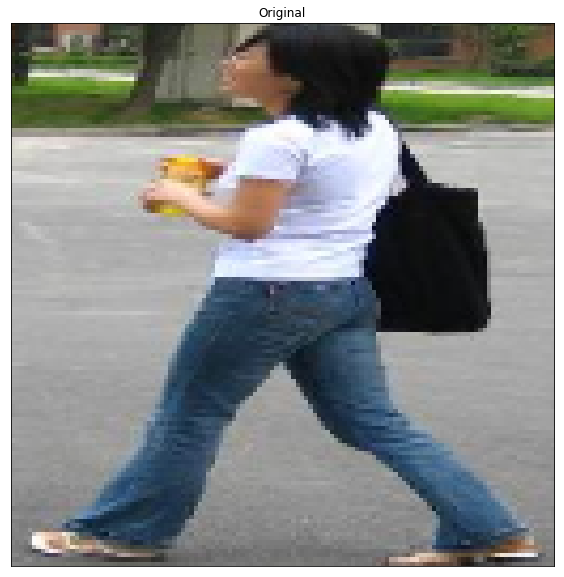

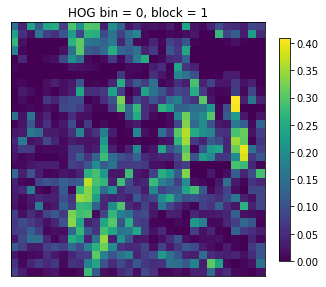

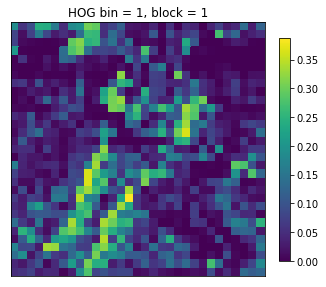

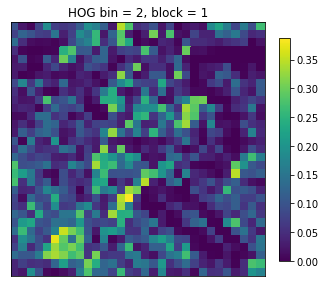

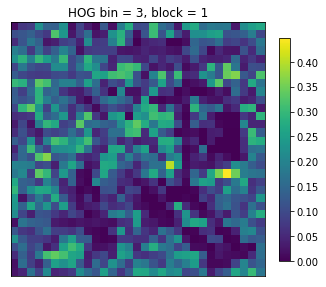

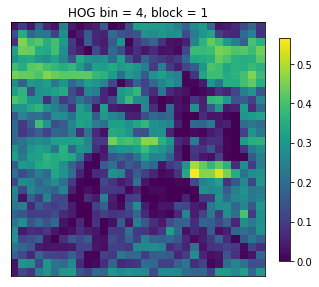

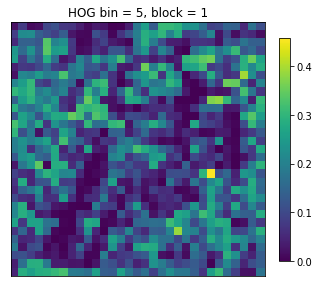

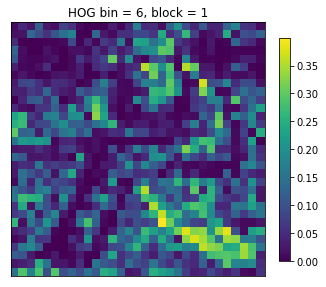

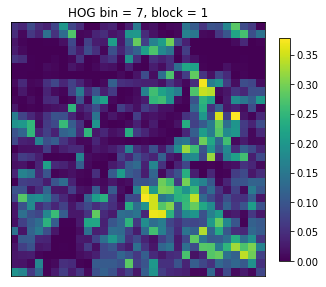

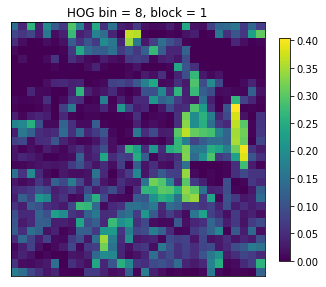

In [24]:
# plot the original image of first block
image_first_block = train[0]
plt.figure(figsize = (10,10))
plt.imshow(image_first_block), plt.title("Original")
plt.xticks([]), plt.yticks([])

for i in range(features[0].shape[-1]):
    plt.figure(figsize = (5,5))
    plt.pcolor(features[0][:, :, 0, 0, i])
    plt.gca().invert_yaxis()
    plt.gca().set_aspect('equal', adjustable='box')
    plt.title("HOG bin = {}, block = 1".format(i)), plt.xticks([]), plt.yticks([])
    plt.colorbar(fraction=0.04)
    

#### Testing
#### 1 Extract overlapping windows from the test image. Experiment with stride and size of the window to achieve good performance. 

In [113]:
# slide a window through the image 
def sliding_window(image, stepSize, windowSize):
    for y in range(0, image.shape[0], stepSize):
        for x in range(0, image.shape[1], stepSize):
            yield (image[y:y + windowSize[1], x:x + windowSize[0]])


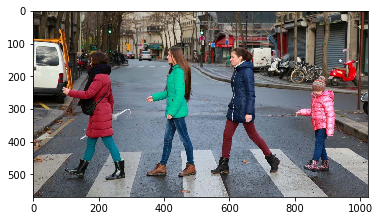

#### 2 . Resize windows to 128 × 128 and Compute HoG features similar to what was done during training. 

1508
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<clas

<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'nu

<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'nu

<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'nu

<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'numpy.ndarray'>
<class 'list'>
<class 'nu

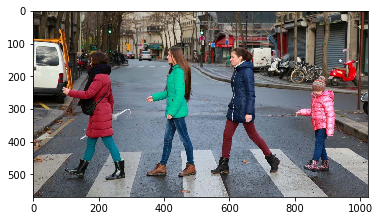

In [116]:
test_image = cv2.imread("test_image.png")
test_image = cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB)
plt.imshow(test_image)

# create sliding window 
size = (128, 128)
test = []
stepSize = 20
windowSize = [128, 128]
windows = sliding_window(test_image, stepSize, windowSize)

# resize images
for image in windows: 
    resize = cv2.resize(image,size)
    test.append(resize)
    
print(len(test))

# compute HoG Feature, calculate and store feature maps 
test_features = HoG(test)

#### 3 Compute the Euclidean distance between the feature map of each window and the mean feature map of training images.

In [79]:
distance = [] 
for feature in test_features:
    distance.append(cv2.norm(meanFeatureMap, feature, normType=cv2.NORM_L2,mask=None))
    
print(distance)

[25.419963058915116, 25.839699302510112, 26.462819194383947, 26.61277054890487, 26.55124812086186, 26.587228869186116, 26.103823951291332, 25.447490465965217, 25.09570526620223, 24.964595350178175, 24.28104424319686, 23.43790333499877, 24.302062797520342, 23.883160542913995, 23.295853128523675, 22.890434675839714, 22.51145566171175, 21.643830683160516, 22.039066701262204, 22.393032049988047, 22.259700262359285, 23.00900173285533, 22.840022393709926, 23.54172763780119, 24.717204021569245, 25.09041718321832, 24.7181964707144, 24.702838013266646, 24.20974986927889, 23.98534418694369, 23.869702158614608, 23.546233497949405, 22.83385024739903, 22.36443873266974, 22.06211164778312, 21.72923393724485, 21.748162290724128, 21.91224790808834, 22.032649390245282, 21.897749142103127, 22.28513603470704, 22.237547956316803, 22.28841029328911, 23.391330191548118, 23.01457651367279, 24.25857573250656, 24.53332756420307, 23.807661237303492, 23.419475735726934, 23.87756229759929, 22.69256454419045, 22.6

#### 4 Threshold the Euclidean distances to detect pedestrians in the test image. Display the detected window. Experiment with threshold values in order to achieve good performance. 

average distance is 21.977640963324117
min distance is  17.21888236002791
71


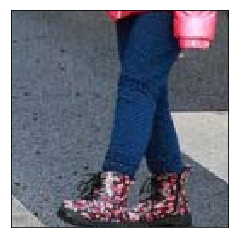

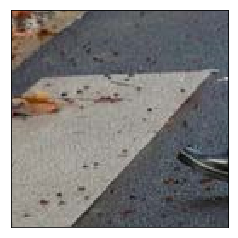

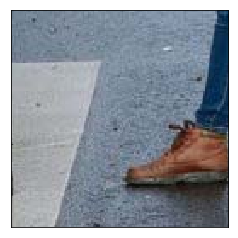

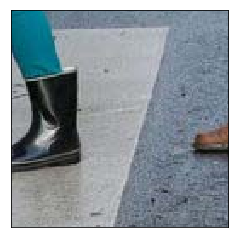

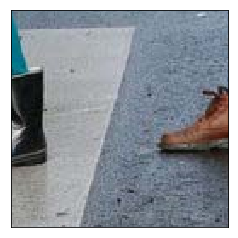

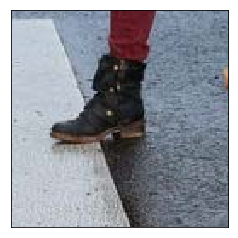

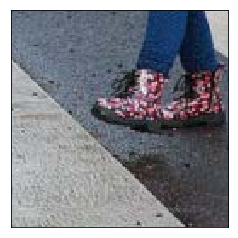

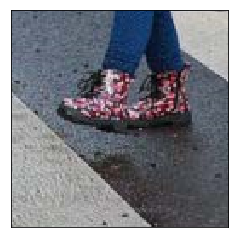

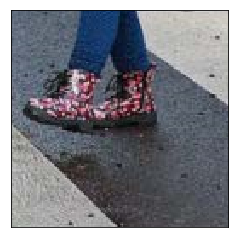

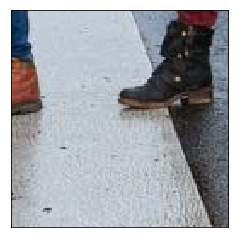

In [119]:
minDistance = 100 
averageDistance = 0 
count = 0 

# find average distance and min distance 
for d in distance: 
    averageDistance += d 
    if (d < minDistance):
        minDistance = d
        
averageDistance = averageDistance/len(distance)

print("average distance is", averageDistance)
print("min distance is ", minDistance)

best_indexs = [] 

# threahold Euclidean distances 
count = 0
for i, d in enumerate(distance):
    if d < minDistance+1:
        best_indexs.append(i)
        count=count+1
        
print(count)

# print a few sliding window images 
for index in range(10):
    plt.imshow(test[best_indexs[index]])
    plt.xticks([]), plt.yticks([])
    plt.show()

average distance is 21.80568839668242
min distance is  17.265532108098782
788


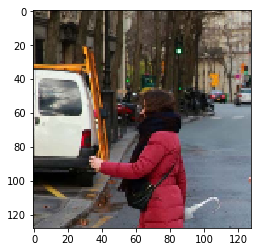

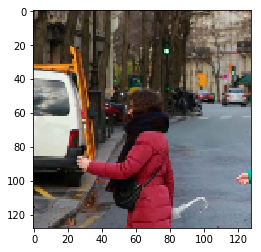

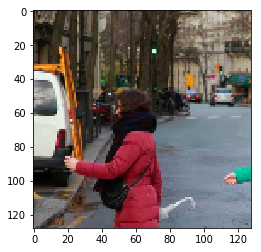

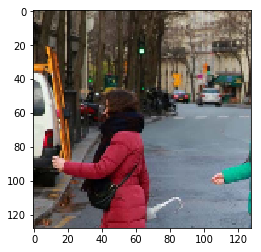

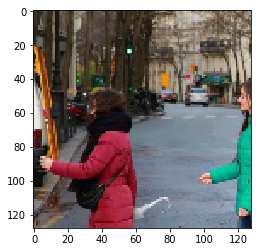

...

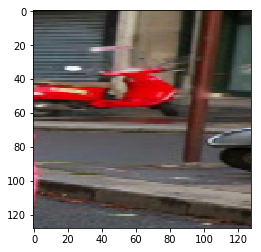

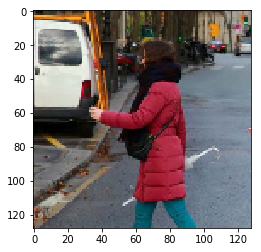

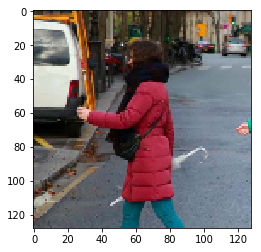

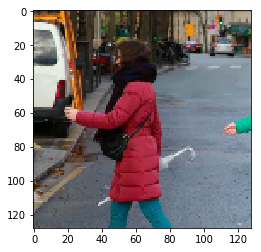

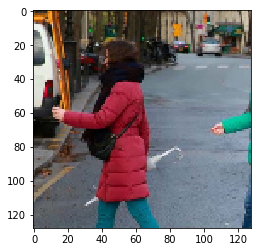

In [177]:
size = (128, 128)
test = []
stepSize = 20
windowSize = [350, 350]

# sliding window 
windows = sliding_window(test_image, stepSize, windowSize)

# resize images
for image in windows: 
    width = 128/image.shape[1]
    height = 128/image.shape[0]
    resize = cv2.resize(image,size)
#     resize = cv2.resize(image,None,fx=width,fy=height,interpolation=cv2.INTER_AREA)
    test.append(resize)

# compute HoG Feature, calculate and store feature maps 
test_features = HoG(test)

minDistance = 100 
averageDistance = 0 
count = 0 

distance = [] 
for feature in test_features:
    distance.append(cv2.norm(meanFeatureMap, feature, normType=cv2.NORM_L2,mask=None))
    

# find average distance and min distance 
for d in distance: 
    averageDistance += d 
    if (d < minDistance):
        minDistance = d
        
averageDistance = averageDistance/len(distance)

print("average distance is", averageDistance)
print("min distance is ", minDistance)

best_indexs = [] 

# threahold Euclidean distances 
count = 0
for i, d in enumerate(distance):
    if d < minDistance+4:
        best_indexs.append(i)
        count=count+1
        
print(count)

# print a few sliding window images 
count = 0

for index in range(len(best_indexs)):
    count = count + 1
    if (count > 100):
        break
    plt.imshow(test[best_indexs[index]])
    plt.show()
